# Análisis Geo-espacial Valdivia y alrededores

Ya es conocido el impacto que tiene Instagram dentro del turismo de una locación en la actualidad, por esto mismo analizaremos los datos sobre las geo-etiquetas más publicadas dentro de las comunas que componen la Región de los Ríos. Los datos se extraerán con el <a href="https://github.com/mhuala/Instagram-locations-scrape">siguiente repositorio de GitHub</a>. <br><br><b>Algunos links sobre el tema:</b> 
    
    
    
<a href="https://www.researchgate.net/publication/286530462_Beyond_User_Gaze_How_Instagram_Creates_Tourism_Destination_Brand">Beyond User Gaze: How Instagram Creates Tourism Destination Brand? - Articulo de Investigación de Megasari N. Fatanti y Wayan Suyadnya </a><br>
<a href="https://www.trekksoft.com/en/blog/how-instagram-has-changed-the-tourism-and-travel-industry">How Instagram has changed the tourism and travel industry - Del portal Trekksoft</a><br>
<a href="https://www.nationalgeographic.com/travel/travel-interests/arts-and-culture/how-instagram-is-changing-travel/">How Instagram Is Changing Travel - De Natioal Geographic</a>

### Librerías :

Se usarán variadas librerías que ayudarán en cada parte del procesamiento de los datos. <ul><li>Carga de los datos.</li><li>Limpieza y refinamiento de los datos.</li><li>Analisis geo-espacial y estadistico de los datos. </li></ul>

<b>Documentaciones de librerías:</b> 
    
    
<a href="https://numpy.org/doc/">Numpy</a><br>
<a href="https://pandas.pydata.org/docs/user_guide/index.html">Pandas</a><br>
<a href="https://matplotlib.org/3.3.2/contents.html">Matplotlib</a><br>
<a href="https://seaborn.pydata.org/tutorial.html">Seaborn</a><br>
<a href="https://python-visualization.github.io/folium/quickstart.html">Folium</a><br>
<a href="https://geopy.readthedocs.io/en/stable/">GeoPy</a><br>
<a href="https://scikit-learn.org/stable/">Scikit-learn</a><br>
<a href="https://docs.scipy.org/doc/scipy/reference/">SciPy</a><br>
<a href="https://docs.scipy.org/doc/scipy/reference/">https://github.com/JustGlowing/minisom</a><br>

In [2]:
#Para trabajar dataframes
import numpy as np
import pandas as pd

#Para Graficar
import matplotlib.pyplot as plt
import seaborn as sns

# Para los mapas y el analisis geo-espacial
import folium
import geopy

# Para el Machine-Learning
from sklearn import preprocessing, cluster
from sklearn.cluster import KMeans
import scipy

# Para el Deep-Learning
import minisom

Esta función limpiará los valores nulos y categorizará los datos en una nueva columna sacando un ratio entre  las personas que geo-etiquetan a un lugar dentro de esta locación y las personas que viven en la locación. <ul><li>Si la cantidad de veces que se ha etiquetado un lugar es mayor a un 3.5% de la población de la localidad se considerará como <b>alto</b></li><li>Si la cantidad de veces que se ha etiquetado un lugar es menor a un 3.5% y mayor a 1% de la población de la localidad se considerará como <b>medio</b></li><li>Si la cantidad de veces que se ha etiquetado un lugar es menor a un 1% de la población de la localidad se considerará como <b>bajo</b></li></ul>

In [3]:
def prepare_data(df):
    
    df = df.drop('id',axis=1)
    df=df.dropna(how='any')
    df = df[df.lat != 'null']
    df["post_ratio"]= None
    df["category"]= None
    population = float(input("How many people live in this location ? : "))
    
    for index, row in df.iloc[:,3].iteritems():
        t_p = row
        try:
            pass
            df.loc[index,"post_ratio"] = (t_p/population) * 100
        except:
            pass
        
    r_high = 3.5
    r_low = 1
    
    mask_a = (df["post_ratio"]>r_high)
    mask_m = (df["post_ratio"]<=r_high)&(df["post_ratio"]>=r_low)
    mask_b = (df["post_ratio"]<r_low)
    df.loc[mask_a, 'category'] = 'high'
    df.loc[mask_m, 'category'] = 'medium'
    df.loc[mask_b, 'category'] = 'low'
    
    return df

Una vez teniendo los datos limpios esta función nos permitirá ver como se distribuye la actividad en Instagram de las distintas geo-etiquetas ubicadas dentro de una locación

In [4]:
def make_hist(df,name):
    x = 'Histogram of categories on {}'.format(name)
    ax = df["category"].value_counts().sort_values().plot(kind="barh")
    totals = []
    for i in ax.patches:
        totals.append(i.get_width())
    total = sum(totals)
    for i in ax.patches:
         ax.text(i.get_width()+.3, i.get_y()+.20, 
         str(round((i.get_width()/total)*100, 2))+'%', 
         fontsize=10, color='black')
    ax.grid(axis="x")
    plt.suptitle(x, fontsize=20)
    plt.show()

Esta función permitirá centrar la iniciación del mapa, posteriormente la sistematica adición de marcadores personalizados según la cantida de publicaciónes y la categoría en la que esté cada geo-etiqueta según su actividad en Instagram, finalmente retornará la visualización del mapa con los marcadores añadidos

In [5]:
def make_map(df,num):
    
    city = "Valdivia"
    ## get location
    locator = geopy.geocoders.Nominatim(user_agent="MyCoder")
    location = locator.geocode(city)
    print(location)
    ## keep latitude and longitude only
    location = [location.latitude, location.longitude]
    print("[lat, long]:", location)
    df['lat'] = df['lat'].astype(float)
    df['lng'] = df['lng'].astype(float)
    data = df.copy()
    
    ## create color column
    color = "category"
    x, y = "lat", "lng"
    size = "post_ratio"
    popup = "location"
    
    if num == 2:
        df= df[df.category != 'low']
        data= data[data.category != 'low']
        lst_colors=["red","orange"]
    elif num ==3:
        lst_colors=["red","green","orange"]
    
    
    lst_elements = sorted(list(df[color].unique()))
    print(lst_elements)
    data["color"] = data[color].apply(lambda x: 
                    lst_colors[lst_elements.index(x)])
    ## create size column (scaled)
    scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
    data["size"] = scaler.fit_transform(
                   data[size].values.reshape(-1,1)).reshape(-1)

    ## initialize the map with the starting location
    map_ = folium.Map(location=location, tiles="cartodbpositron",
                      zoom_start=11)
    ## add points
    data.apply(lambda row: folium.CircleMarker(
               location=[row[x],row[y]], popup=row[popup],
               color=row["color"], fill=True,
               radius=row["size"]).add_to(map_), axis=1)
    ## add html legend
    legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
    for i in lst_elements:
         legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
         fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+"""">
         </i>&nbsp;"""+str(i)+"""<br>"""
    legend_html = legend_html+"""</div>"""
    map_.get_root().html.add_child(folium.Element(legend_html))

    ## plot the map
    return map_

<td style="text-align:left;font-size:17px; font-family:Times New Roman; line-height: 1.6; width:1080px"; bgcolor="ffeeab"; > Para el análisis usaremos los siguientes datos de población de cada lugar : <ul><li>Valdivia: 143207 personas</li><li>Corral: 5250 personas</li><li>Niebla: 2202 personas</li><li>Mariquina: 18223 personas</li><li>Máfil: 7213 personas </li><li>Futrono: 8063 personas </li><li>Panguipulli: 33273 personas</li><li>Lago Ranco: 10098 personas</li><li>Río Bueno: 32981 personas</li><li>La Uníon: 39447 personas</li><li>Los Lagos: 19634 personas</li><li>Lanco: 20107 personas</li><li>Paillaco: 19790 personas</li></ul>

</td>

## Carga de datos

In [6]:
df_1  = pd.read_json('Valdivia_places_data.json')
df_2  = pd.read_json('Corral_places_data.json')
df_3  = pd.read_json('Niebla_places_data.json')
df_m1  = pd.read_json('Mariquina_places_data.json')
df_m2  = pd.read_json('San José de la Mariquina_places_data.json')
df_m2.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_4 = pd.concat([df_m1,df_m2])
df_5  = pd.read_json('Máfil_places_data.json')
df_6 = pd.read_json('Futrono_places_data.json')
df_6.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_7 = pd.read_json('Panguipulli_places_data.json')
df_7.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_8 = pd.read_json('Lago Ranco_places_data.json')
df_8.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_9 = pd.read_json('Río Bueno_places_data.json')
df_9.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_10 = pd.read_json('La Unión_places_data.json')
df_10.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_11 = pd.read_json('Los Lagos_places_data.json')
df_11.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_12 = pd.read_json('Lanco_places_data.json')
df_12.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)
df_13 = pd.read_json('Paillaco_places_data.json')
df_13.rename(columns={'Oct-17-2020':'Oct-15-2020'}, inplace=True)


In [7]:
df_val = prepare_data(df_1)
df_cor = prepare_data(df_2)
df_nie = prepare_data(df_3)
df_mar = prepare_data(df_4)
df_maf = prepare_data(df_5)
df_fut = prepare_data(df_6)
df_pan = prepare_data(df_7)
df_lag = prepare_data(df_8)
df_rio = prepare_data(df_9)
df_lun = prepare_data(df_10)
df_lol = prepare_data(df_11)
df_lan = prepare_data(df_12)
df_pai = prepare_data(df_13)

How many people live in this location ? : 143207
How many people live in this location ? : 5250
How many people live in this location ? : 2202
How many people live in this location ? : 18223
How many people live in this location ? : 7213
How many people live in this location ? : 8063
How many people live in this location ? : 33273
How many people live in this location ? : 10098
How many people live in this location ? : 32981
How many people live in this location ? : 39447
How many people live in this location ? : 19634
How many people live in this location ? : 20107
How many people live in this location ? : 19790


## Distribución de actividad de etiquetas de instagram por localidad

Existe un abanico de algoritmos que podemos utilizar para realizar el agrupamiento (clusterización). Partiremos realizando el analisis con el metodo de <b>K-medias</b> <i>(K-means en inglés)</i> que tiene como objetivo la partición de un conjunto de <b> <u>n</u></b> observaciones en <b> <u>k</u></b> grupos en el que cada observación pertenece al grupo cuyo <b>valor medio</b> es más cercano.<br><br>Primeros debemos establecer el numero de clusters o centroides que queremos para esto también existe más de un tipo de analisis, quizás un analisis de silueta podría ayudar pero la carga computacional de x5 a x10, con fines practicos se usará el <i>Metodo del codo</i> que permite determinar el numero de clusters o centroides que hay en un dataset.<br><br>Generaremos dos analisis de K-medias uno solo con las coordenadas y otro donde además incluiremos una variable que otorgará "pesos" a la clusterización.

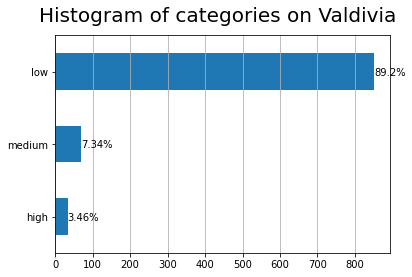

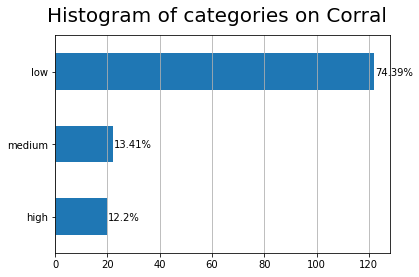

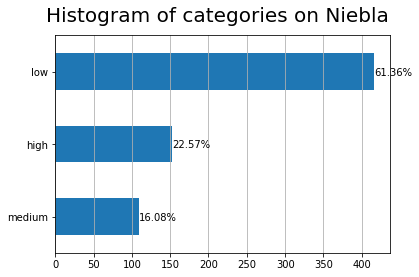

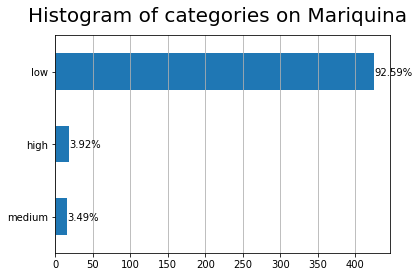

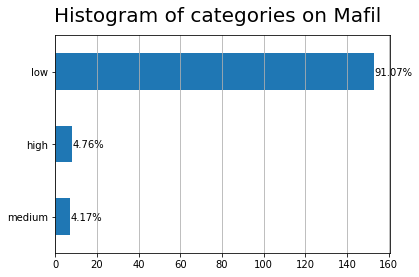

...

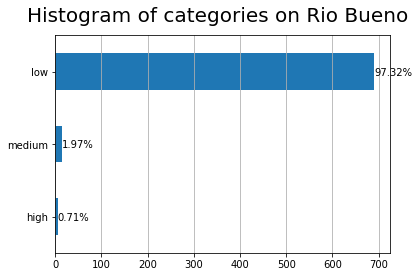

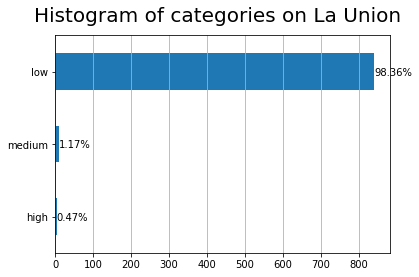

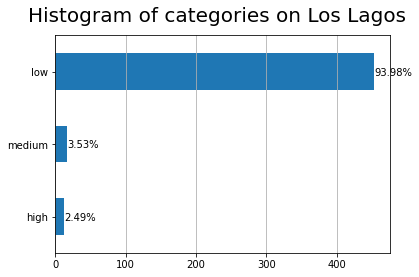

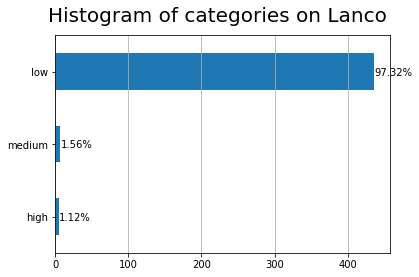

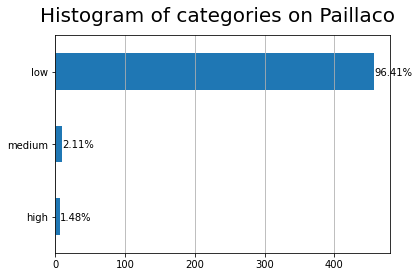

In [8]:
make_hist(df_val,"Valdivia");make_hist(df_cor,"Corral");make_hist(df_nie,"Niebla");make_hist(df_mar,"Mariquina");make_hist(df_maf,"Mafil");make_hist(df_fut,"Futrono");make_hist(df_pan,"Panguipulli");make_hist(df_lag,"Lago Ranco");make_hist(df_rio,"Rio Bueno");make_hist(df_lun,"La Union");make_hist(df_lol,"Los Lagos");make_hist(df_lan,"Lanco");make_hist(df_pai,"Paillaco");

In [9]:
df_region = pd.concat([df_val,df_cor,df_nie,df_mar,df_maf,df_fut,df_pan,df_lag,df_rio,df_lun,df_lol,df_lan,df_pai])

In [10]:
df_region.head()

,location,lat,lng,Oct-15-2020,post_ratio,category
0,"Valdivia, Chile",-39.8139,-73.2458,1140911.0,796.687,high
1,Los Ríos Region,-39.8119,-73.2468,108383.0,75.6828,high
2,"Ciudad De Valdivia, Los Ríos, Chile",-39.814323101,-73.2458456005,105569.0,73.7178,high
3,Valdivia - Capital de Los Ríos,-39.8153740053,-73.2357136319,68988.0,48.1736,high
4,Konoha,-39.8262228258,-73.2275065687,64379.0,44.9552,high


## Visualización de actividad de etiquetas en la Región

Con el dataframe <b>df_region</b> creado concatenando los dataframe de las distintas comunas podemos ver en el mapa donde se encuentran los puntos de mayor actividad en Instagram respecto a su población : <ul><li>Rojo : Alto nivel de actividad, canitadad total de ettiquetas mayor al 3.5% de la población de la comuna.</li><li>Amarillo: Medio nivel de actividad, cantidad total de etiquetas entre el 3.5% y el 1% de la población de la comuna.</li><li>Verde: Bajo nivel de actividad, cantidad total de etiquetas menor al 1% de la población de la comuna.</li></ul><br> También podemos generar el mismo mapa pero ahora quitando los puntos que tienen un nivel de actividad bajo(que son la mayoría), pudiendo ver así donde se concentra la actividad en Instagram dentro de las distintas comunas.

In [11]:
make_map(df_region,3)

Valdivia, Provincia de Valdivia, Región de Los Ríos, Chile
[lat, long]: [-39.8141965, -73.2458525]
['high', 'low', 'medium']


In [12]:
make_map(df_region,2)

Valdivia, Provincia de Valdivia, Región de Los Ríos, Chile
[lat, long]: [-39.8141965, -73.2458525]
['high', 'medium']


### Cluster Análisis : K-medias

Existe un abanico de algoritmos que podemos utilizar para realizar el agrupamiento (clusterización). Partiremos realizando el analisis con el metodo de <b>K-medias</b> <i>(K-means en inglés)</i> que tiene como objetivo la partición de un conjunto de <b> <u>n</u></b> observaciones en <b> <u>k</u></b> grupos en el que cada observación pertenece al grupo cuyo <b>valor medio</b> es más cercano.<br><br>Primeros debemos establecer el numero de clusters o centroides que queremos para esto también existe más de un tipo de analisis, quizás un analisis de silueta podría ayudar pero la carga computacional de x5 a x10, con fines practicos se usará el <i>Metodo del codo</i> que permite determinar el numero de clusters o centroides que hay en un dataset.<br><br>Generaremos dos analisis de K-medias uno solo con las coordenadas y otro donde además incluiremos una variable que otorgará "pesos" a la clusterización.

In [13]:
def weighted_elbow_method(df,k_max,name):
    K_clusters = range(1,k_max)
    kmeans = [KMeans(n_clusters=i) for i in K_clusters]
    lat_long = df[df.columns[1:3]]
    post_ratio = df[df.columns[4]]
    sample_weight = post_ratio
    score = [kmeans[i].fit(lat_long, sample_weight = post_ratio).score(lat_long) for i in range(len(kmeans))]
    fig, ax = plt.subplots()
    plt.plot(K_clusters, score)
    ax.set(title=str(name)+': Weighted Elbow Method', xlabel='Number of clusters', ylabel="Score")
    ax.grid(True)
    return plt.show()

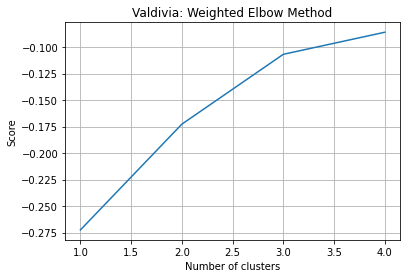

In [14]:
weighted_elbow_method(df_val,5,'Valdivia')

In [15]:
def simple_elbow_method(df,k_max,name):
    K_clusters = range(1,k_max)
    kmeans = [KMeans(n_clusters=i) for i in K_clusters]
    Y_axis = df[['lat']]
    X_axis = df[['lng']]
    score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
    # Visualize
    fig, ax = plt.subplots()
    plt.plot(K_clusters, score)
    ax.set(title=str(name)+': Unweighted Elbow Method', xlabel='Number of clusters', ylabel="Score")
    ax.grid(True)
    return plt.show()

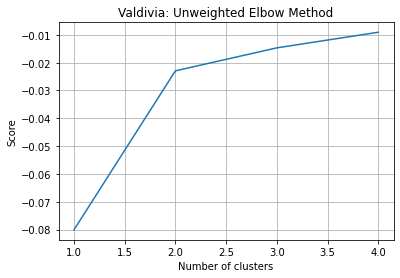

In [16]:
simple_elbow_method(df_val,5,'Valdivia')

Podemos tratar con <b>k = 3</b> asi que el algoritmo K-Means entontrará 5 centroides teoricos. Además, se identificarán los centroides reales (las observaciones mas cercanas al centroide teorico).

In [40]:
def centroid_plot(df,k):
    model = cluster.KMeans(n_clusters=k, init='k-means++')
    X = df[["lat","lng"]]
    ## clustering
    dtf_X = X.copy()
    ## Convert latitude and longitude
    dtf_X['lat'] = dtf_X['lat'].astype(float)
    dtf_X['lng'] = dtf_X['lng'].astype(float)
    df['lat'] = df['lat'].astype(float)
    df['lng'] = df['lng'].astype(float)
    dtf_X["cluster"] = model.fit_predict(X)
    ## find real centroids
    closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, dtf_X.drop("cluster", axis=1).values)
    dtf_X["centroids"] = 0
    for i in closest:
        dtf_X["centroids"].iloc[i] = 1
    ## add clustering info to the original dataset
    df[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]
    fig, ax = plt.subplots()
    sns.scatterplot(x="lat", y="lng", data=df, 
                    palette=sns.color_palette("bright",k),
                    hue='cluster', size="centroids", size_order=[1,0],
                    legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
    th_centroids = model.cluster_centers_
    ax.grid(True)
    ax.scatter(th_centroids[:,0], th_centroids[:,1], s=50, c='black', marker="x")
    return df

c:\users\manue\appdata\local\programs\python\python38\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


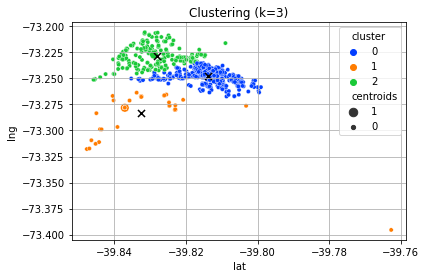

In [41]:
clusters_val= centroid_plot(df_val,3)

Definimos una función que añada en el mapa los centroides reales y nos marque por color los datos de cada cluster.

In [42]:
def cluster_map(df):
    x, y = "lat", "lng"
    size = "post_ratio"
    popup = "location"
    color = "cluster"
    marker = "centroids"
    ## get location
    city = "Valdivia"
    locator = geopy.geocoders.Nominatim(user_agent="MyCoder")
    location = locator.geocode(city)
    print(location)
    ## keep latitude and longitude only
    location = [location.latitude, location.longitude]
    data = df.copy()
    ## create color column
    lst_elements = sorted(list(df[color].unique()))
    lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for i in 
                  range(len(lst_elements))]
    data["color"] = data[color].apply(lambda x: 
                    lst_colors[lst_elements.index(x)])
    ## create size column (scaled)
    scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
    data["size"] = scaler.fit_transform(
                   data[size].values.reshape(-1,1)).reshape(-1)
    ## initialize the map with the starting location
    map_ = folium.Map(location=location, tiles="cartodbpositron",
                      zoom_start=11)
    ## add points
    data.apply(lambda row: folium.CircleMarker(
               location=[row[x],row[y]], popup=row[popup],
               color=row["color"], fill=True,
               radius=row["size"]).add_to(map_), axis=1)
    ## add html legend
    legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
    for i in lst_elements:
         legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
         fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+"""">
         </i>&nbsp;"""+str(i)+"""<br>"""
    legend_html = legend_html+"""</div>"""
    map_.get_root().html.add_child(folium.Element(legend_html))
    ## add centroids marker
    lst_elements = sorted(list(df[marker].unique()))
    data[data[marker]==1].apply(lambda row: 
               folium.Marker(location=[row[x],row[y]], 
               popup=row[marker], draggable=False,          
               icon=folium.Icon(color="black")).add_to(map_), axis=1)
    ## plot the map
    return map_

In [43]:
cluster_map(clusters_val)

Valdivia, Provincia de Valdivia, Región de Los Ríos, Chile


Podemos realizar el mismo tipo de analisis para los otros dataframe, incluso para el dataframe de la región...